In [35]:
%pip install numpy matplotlib

Note: you may need to restart the kernel to use updated packages.


In [36]:
import numpy as np
import matplotlib as plt
import cv2

Numer_indeksu % liczba_zdjęć = x

In [37]:
nr_zdj = 335201 % 36
print("numer zdjęcia po losowaniu: ", nr_zdj)

numer zdjęcia po losowaniu:  5


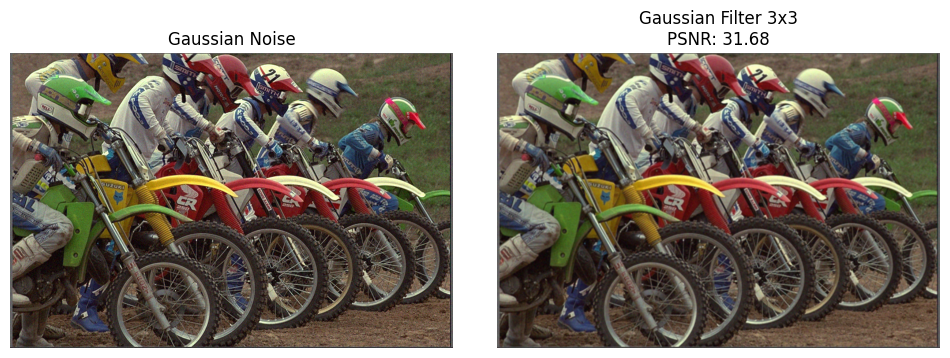

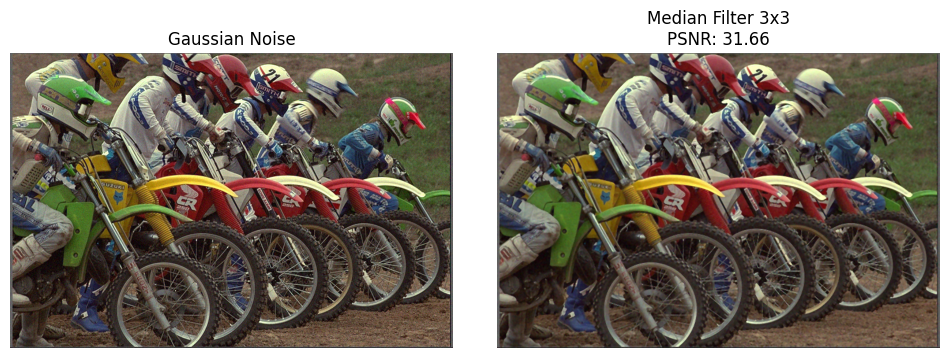

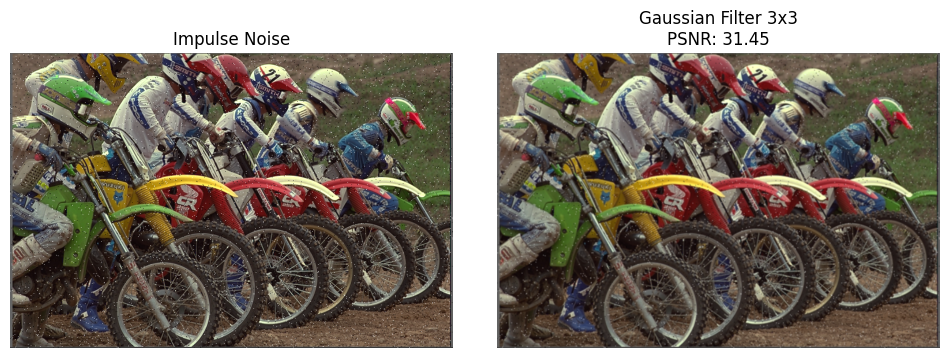

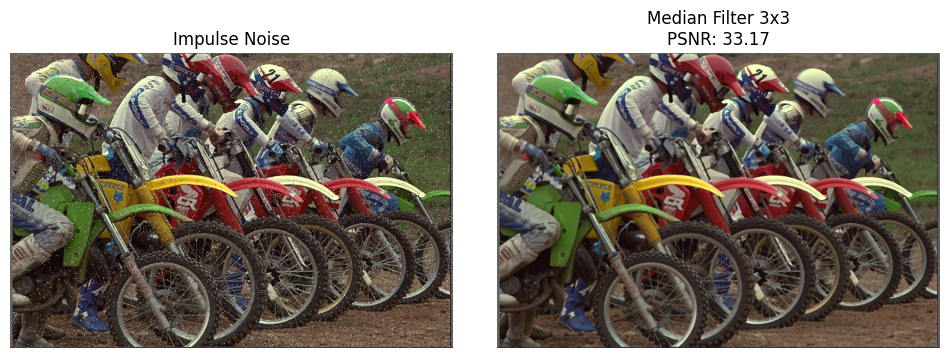

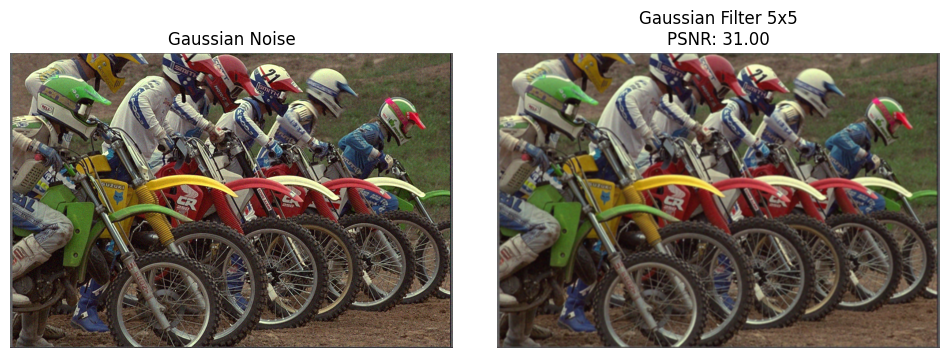

...

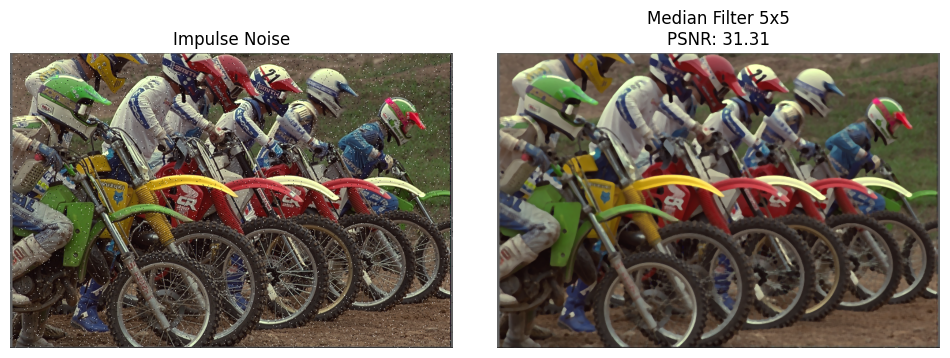

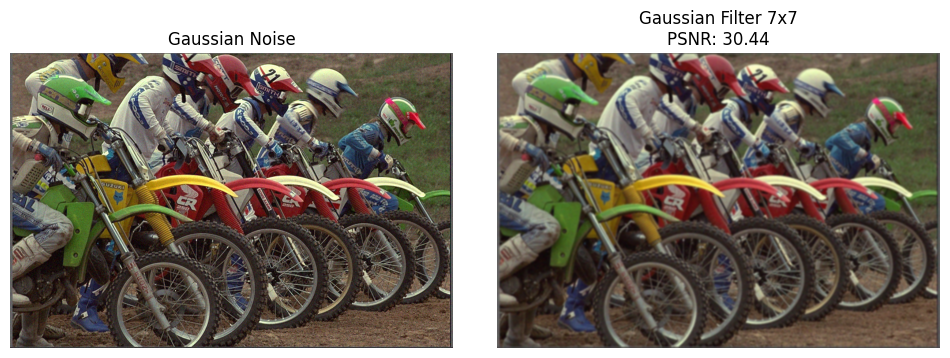

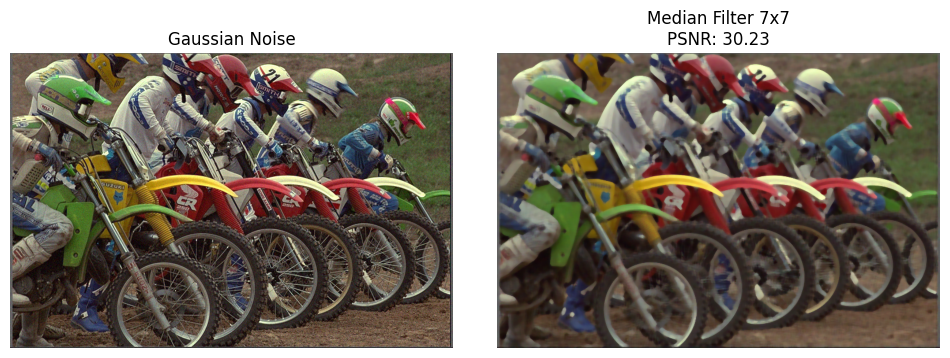

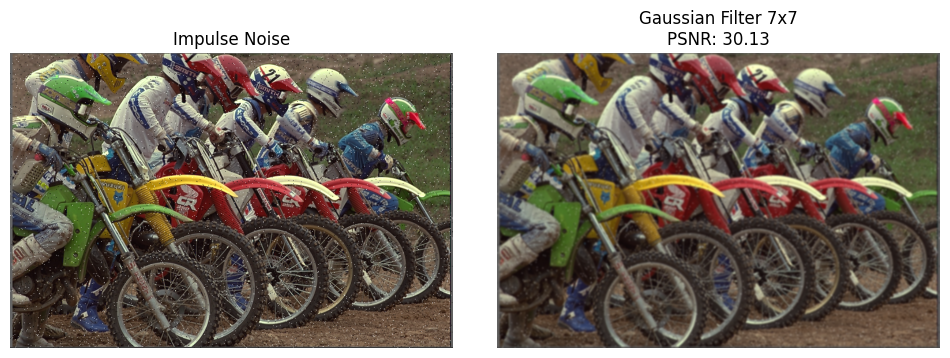

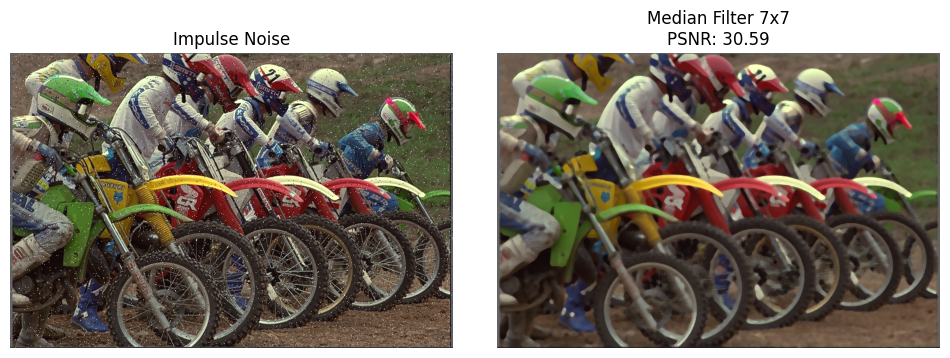

,Noise,Filter,Kernel Size,PSNR
0,Gaussian Noise,Gaussian Filter,3x3,31.675740
1,Gaussian Noise,Median Filter,3x3,31.660734
2,Impulse Noise,Gaussian Filter,3x3,31.453590
3,Impulse Noise,Median Filter,3x3,33.172193
4,Gaussian Noise,Gaussian Filter,5x5,31.000812
5,Gaussian Noise,Median Filter,5x5,30.746662
6,Impulse Noise,Gaussian Filter,5x5,30.669327
7,Impulse Noise,Median Filter,5x5,31.307167
8,Gaussian Noise,Gaussian Filter,7x7,30.438329
9,Gaussian Noise,Median Filter,7x7,30.226308


In [57]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Funkcje wczytywania obrazów i filtracji
def readImages():
    original_image = cv2.imread(r'C:\Users\kamil\OneDrive\Pulpit\PW\sem2\WMM\Lab1\WMM_WUT\LAB_4\obrazy_testowe\color\bikes_col.png', cv2.IMREAD_UNCHANGED)
    gaussian_noise_image = cv2.imread(r'C:\Users\kamil\OneDrive\Pulpit\PW\sem2\WMM\Lab1\WMM_WUT\LAB_4\obrazy_testowe\color_noise\bikes_col_noise.png', cv2.IMREAD_UNCHANGED)
    impulse_noise_image = cv2.imread(r'C:\Users\kamil\OneDrive\Pulpit\PW\sem2\WMM\Lab1\WMM_WUT\LAB_4\obrazy_testowe\color_inoise1\bikes_col_inoise.png', cv2.IMREAD_UNCHANGED)
    return original_image, gaussian_noise_image, impulse_noise_image

def gaussianFilter(image, kernel_size):
    return cv2.GaussianBlur(image, (kernel_size, kernel_size), 0)

def medianFilter(image, kernel_size):
    return cv2.medianBlur(image, kernel_size)

def calcPSNR(img1, img2):
    mse = np.mean((img1 - img2) ** 2)
    if mse == 0:
        return float('inf')
    PIXEL_MAX = 255.0
    return 20 * np.log10(PIXEL_MAX / np.sqrt(mse))

images = readImages()
kernel_sizes = [3, 5, 7]
psnr_results = []

for kernel_size in kernel_sizes:
    for noise_image, noise_label in zip(images[1:], ['Gaussian Noise', 'Impulse Noise']):
        for filter_func, filter_name in [(gaussianFilter, 'Gaussian Filter'), (medianFilter, 'Median Filter')]:
            filtered_image = filter_func(noise_image, kernel_size)
            psnr = calcPSNR(images[0], filtered_image)
            psnr_results.append({
                'Noise': noise_label, 
                'Filter': filter_name, 
                'Kernel Size': f'{kernel_size}x{kernel_size}', 
                'PSNR': psnr
            })
            
            plt.figure(figsize=(12, 6))
            plt.subplot(1, 2, 1)
            plt.imshow(cv2.cvtColor(noise_image, cv2.COLOR_BGR2RGB))
            plt.title(noise_label)
            plt.axis('off')

            plt.subplot(1, 2, 2)
            plt.imshow(cv2.cvtColor(filtered_image, cv2.COLOR_BGR2RGB))
            plt.title(f"{filter_name} {kernel_size}x{kernel_size}\nPSNR: {psnr:.2f}")
            plt.axis('off')

            plt.subplots_adjust(wspace=0.1, hspace=0)
            plt.show()

# Wyświetlenie wyników PSNR
psnr_df = pd.DataFrame(psnr_results)
display(psnr_df)
